In [1]:
import numpy as np
import pandas as pd

import pyboat
from pyboat import ensemble_measures as em
from pyboat import WAnalyzer, ssg
from pyboat import plotting as pl

import scipy.signal
import pywt

import matplotlib.pyplot as plt

import bokeh_catplot
from bokeh.plotting import figure, show
from bokeh.models import FactorRange, Button, ColumnDataSource, HoverTool, TapTool, Slider, Select, Span, BoxZoomTool

import bokeh.io

import iqplot

bokeh.io.output_notebook()

C:\Users\pperez\.conda\envs\devbio-napari-cupy\lib\site-packages\bokeh_catplot\__init__.py:13: DeprecationWarning: bokeh-catplot is deprecated. Use iqplot instead.
  warnings.warn("bokeh-catplot is deprecated. Use iqplot instead.", DeprecationWarning)
C:\Users\pperez\.conda\envs\devbio-napari-cupy\lib\site-packages\bokeh\io\notebook.py:487: DeprecationWarning: The `source` parameter emit a  deprecation warning since IPython 8.0, it had no effects for a long time and will  be removed in future versions.
  publish_display_data(data, metadata, source, transient=transient, **kwargs)


Loading BokehJS ...

In [3]:
cd H:/PROJECTS-03/Pablo/oscillating/ppf024/

H:\PROJECTS-03\Pablo\oscillating\ppf020


In [5]:
def analyze_signal(signals, df_fouriers, wAn, save_path=None, plot=False):
    for signal in signals.columns:
        detrended = wAn.sinc_detrend(signals[signal], T_c = 200)
        wAn.compute_spectrum(detrended, do_plot=plot)
        if plot == True:
            plt.title(signal)
        df_fouriers[signal] = wAn.get_averaged_spectrum()
        if save_path is not None:
            plt.savefig(fname=save_path+signal)
    return df_fouriers

In [6]:
def analyze_signal_osc(signals, df_fouriers, wAn, save_path=None, plot=False, peak_data=peak_data, ridge_threshold=0.5):
    ridges = {}
    for signal in signals.columns:
        bo = int(peak_data.loc[peak_data['Signal']==signal, 'Beginning of oscillation'].min())
        eo = int(peak_data.loc[peak_data['Signal']==signal, 'End of oscillation'].max())
        detrended = wAn.sinc_detrend(signals[signal], T_c = 140)
        try:
            normalized = wAn.normalize_amplitude(detrended, window_size=44)
            wAn.compute_spectrum(normalized[bo:eo], do_plot=plot)
            df_fouriers[signal] = wAn.get_averaged_spectrum()
            ridge = wAn.get_maxRidge(power_thresh=1, smoothing_wsize=None)
            # if len(ridge) >= (ridge_threshold * len(signals[signal][bo:eo+1])):
            ridges[signal]=ridge
            wAn.draw_Ridge()
            if plot == True:
                plt.title(signal)
            if save_path is not None:
                plt.savefig(fname=save_path+signal)
        except np.linalg.LinAlgError:
            pass
    return df_fouriers, ridges

In [7]:
def plot_fourier(freq_domain, signal, peak, y_value):
    x = freq_domain
    y = signal
    plt.plot(x, y)
    plt.xlim(np.min(x), np.max(x))
    plt.xlabel('Period (min)')
    plt.ylabel('Power')
    plt.plot(peak, y_value, marker="x", markersize=5, markeredgecolor="red", markerfacecolor="red")    

In [8]:
def process_peaks(df_fouriers, freq_domain, cut_off=130, peak_prom=0.50):
    max_peak = []
    name_signal = []
    non_processed = []
    for f_signal in df_fouriers.columns:
        try:
            # peak = freq_domain[np.max(scipy.signal.find_peaks(df_fouriers[f_signal], prominence=peak_prom, height=1, width=5)[0])]
            peak = freq_domain[np.min(scipy.signal.find_peaks(df_fouriers[f_signal], prominence=peak_prom, height=1)[0])]
            if peak < cut_off: 
                max_peak.append(peak)
                name_signal.append(f_signal)
        except ValueError:
            print(f'Cannot find peak for {f_signal}')
            non_processed.append(f_signal)
    return np.array(max_peak, dtype=np.float32), name_signal, non_processed

In [9]:
def check_peaks(signals, peaks, df_fouriers, agg=False, med_mean = False, title=None):
    for signal, peak in zip(signals, peaks):
        freq_domain = df_fouriers.index
        closest_value = min(df_fouriers_control.index, key=lambda x: abs(peak - x))
        y_value = df_fouriers.loc[closest_value, signal]
        plot_fourier(freq_domain, df_fouriers[signal], peak, y_value)
        if agg==True:
            plt.ylim(0,8)
            plt.yticks(ticks=range(0, 13, 1), labels=map(str, range(0, 13 , 1)))
        else:
            plt.title(signal)
            plt.show()

    if agg == True:
        plt.title(title)
        if med_mean==True:
            plt.axvline(x = np.mean(peaks), color ='b')
            plt.axvline(x = np.median(peaks), color ='r')
            plt.show()
        else:
            plt.show()

In [18]:
def normalize_df(dataframe):
    normalized_dataframe = dataframe.copy()
    for column in dataframe.columns.values:
        normalized_dataframe[column] = (normalized_dataframe[column] - normalized_dataframe[column].min()) / (normalized_dataframe[column].max() - normalized_dataframe[column].min())  
    return normalized_dataframe

In [10]:
def detrend_df(dataframe):
    detrended_dataframe = dataframe.copy()
    for column in dataframe.columns.values:
        detrended_dataframe[column] = detrended_dataframe[column] - wAn.sinc_smooth(detrended_dataframe[column], T_c=200)
    return detrended_dataframe

In [10]:
# Set up analyzing instance
dt = 11 # Sample rate
periods = np.linspace(2*dt, 220, 1000)    # Generate the freq domain. By default 2*dt is minimum period following Nyquist-Shannon criterion
wAn = WAnalyzer(periods, dt, time_unit_label='min')              # Instantiate waveletet analyzer

In [11]:
# Load traces and signals
traces = pd.read_csv('./valid_signals_ppf025_bs_median_interpol', index_col=0)
peak_data = pd.read_csv('./peak_data_ppf025_median_corr', index_col=0)

In [18]:
wAn.draw_Ridge?

Signature: wAn.draw_Ridge(marker_size=1.5)
Docstring: <no docstring>
File:      c:\users\pperez\.conda\envs\devbio-napari-cupy\lib\site-packages\pyboat\api.py
Type:      method


In [12]:
control_mask = peak_data.loc[peak_data['Condition']=='Control','Signal'].unique()
mask_40nm = peak_data.loc[peak_data['Condition']=='40 nM','Signal'].unique()
mask_80nm = peak_data.loc[peak_data['Condition']=='80 nM','Signal'].unique()

In [31]:
control_mask

array(['ppf021_xy001_0', 'ppf021_xy004_0', 'ppf021_xy005_0',
       'ppf021_xy006_0', 'ppf021_xy007_0', 'ppf021_xy008_0',
       'ppf021_xy010_0', 'ppf021_xy011_0', 'ppf021_xy013_0',
       'ppf021_xy014_0', 'ppf021_xy016_0', 'ppf021_xy020_0',
       'ppf021_xy021_0', 'ppf021_xy026_0', 'ppf021_xy027_0',
       'ppf021_xy028_0', 'ppf021_xy029_0', 'ppf021_xy030_0',
       'ppf021_xy034_2', 'ppf021_xy035_0'], dtype=object)

In [19]:
signals_control = normalize_df(traces[control_mask])
signals_40nm = normalize_df(traces[mask_40nm])
signals_80nm = normalize_df(traces[mask_80nm])

In [20]:
# Define the Fourier components to be populated with the result of the analyzer
df_fouriers_control = pd.DataFrame(index=wAn.periods)
df_fouriers_40nm = pd.DataFrame(index=wAn.periods)
df_fouriers_80nm = pd.DataFrame(index=wAn.periods)

C:\Users\pperez\.conda\envs\devbio-napari-cupy\lib\site-packages\pyboat\plotting.py:260: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = ppl.figure(figsize=(x_size, 6.5))


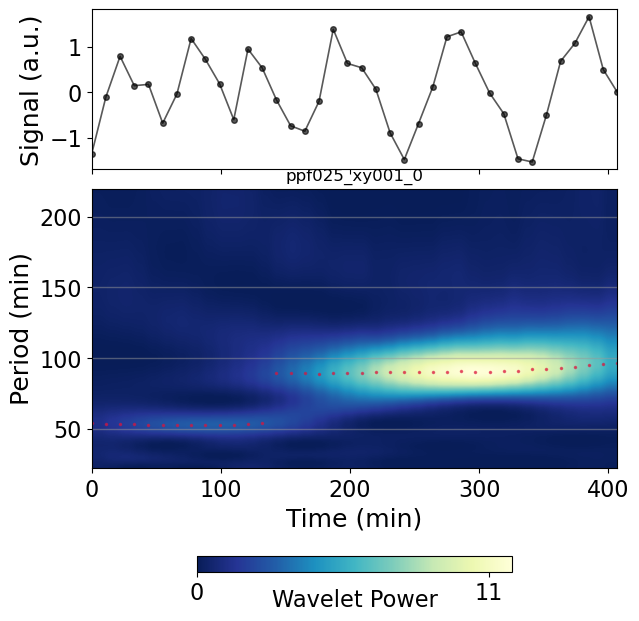

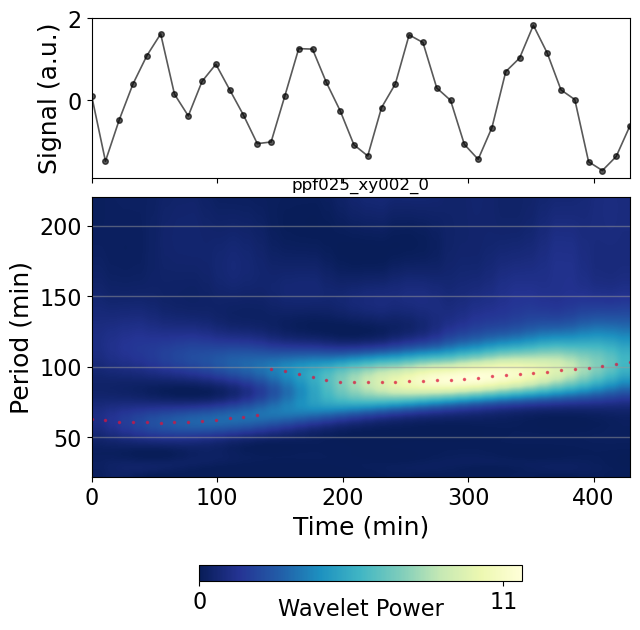

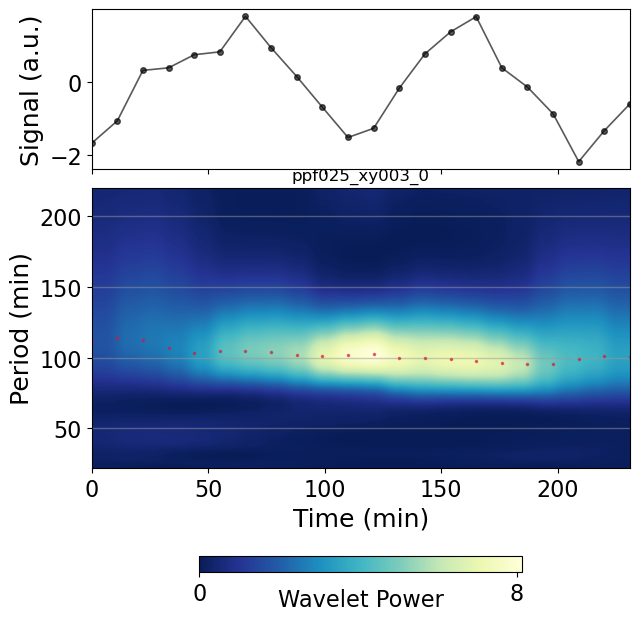

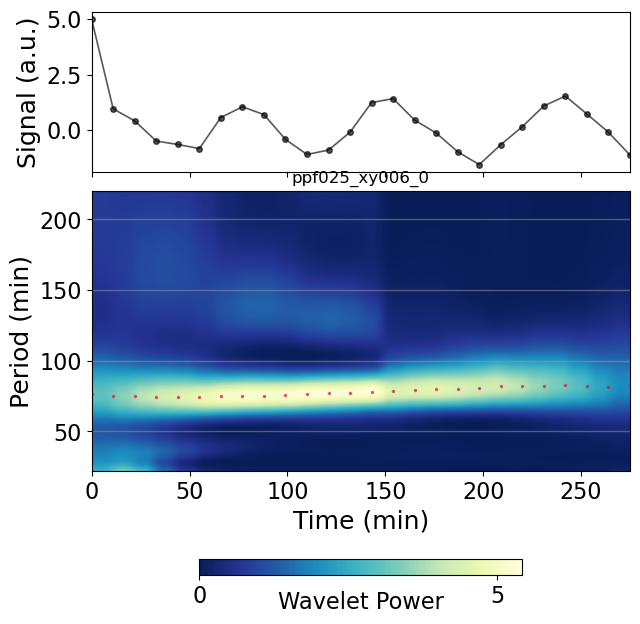

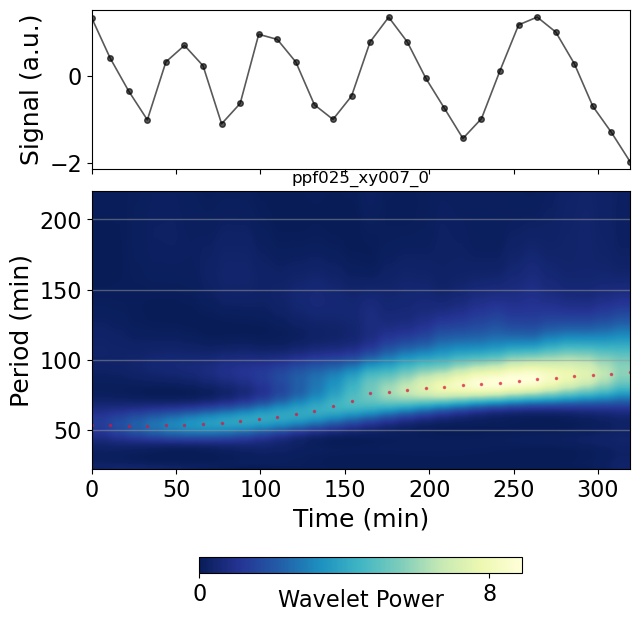

...

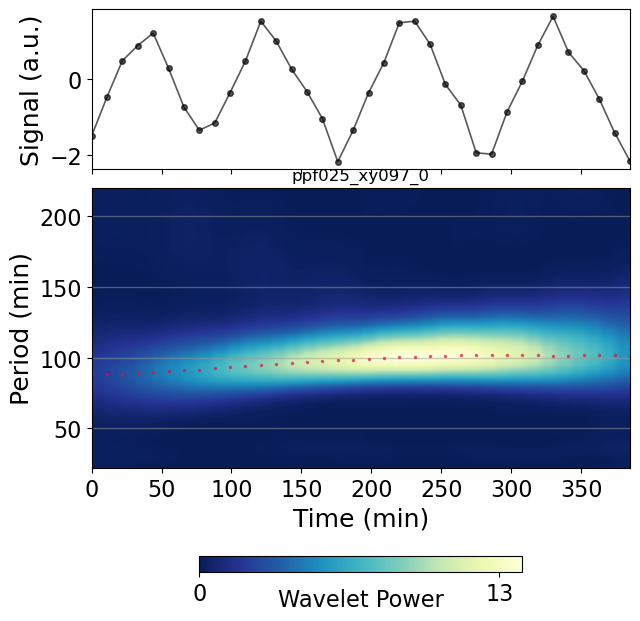

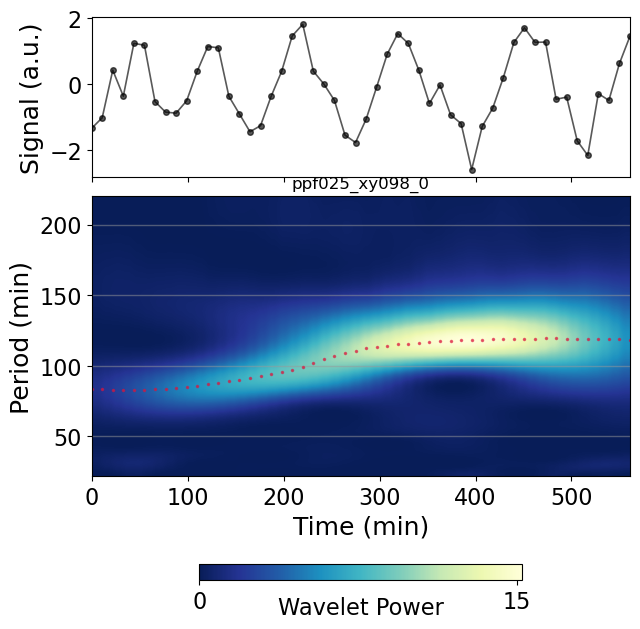

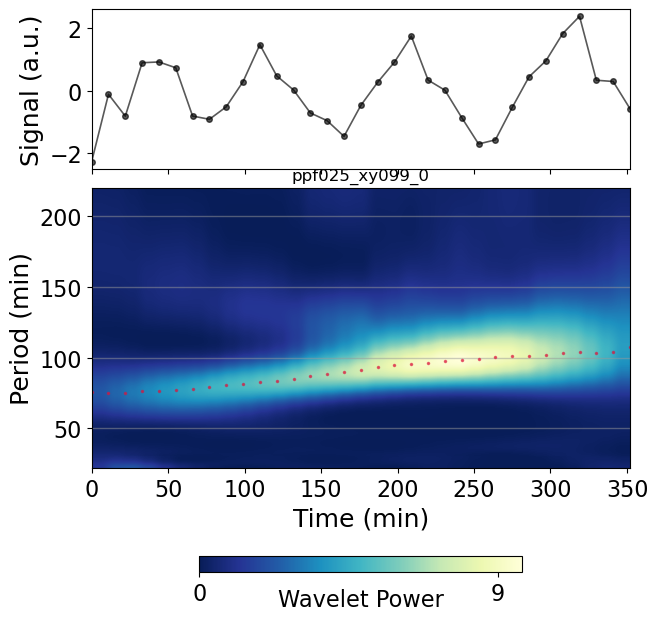

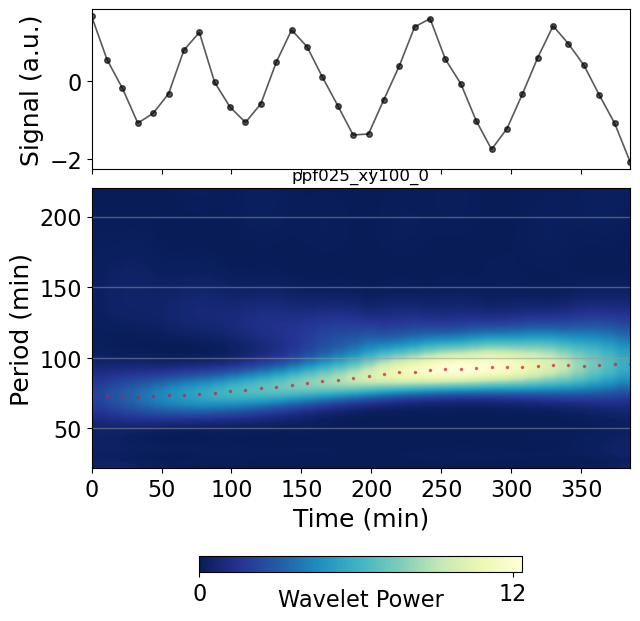

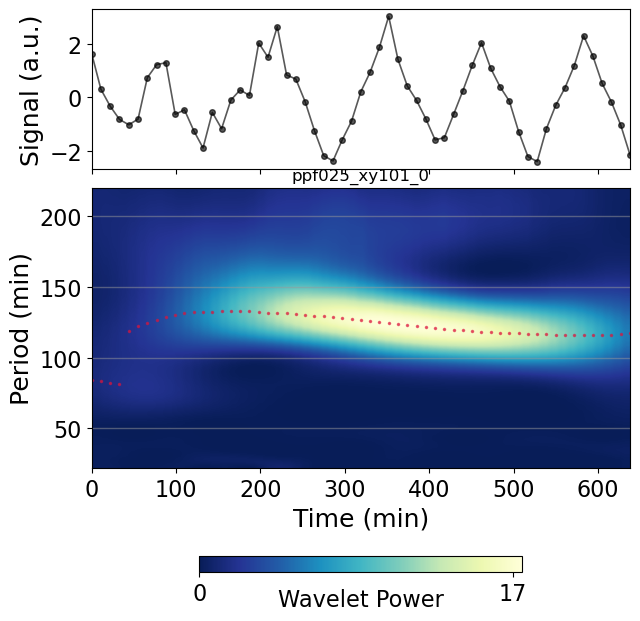

In [21]:
# Compute wavelet, plot spectrogram estimate DTFT
df_fouriers_control, ridges_control = analyze_signal_osc(signals_control, df_fouriers=df_fouriers_control, wAn=wAn, save_path=None, plot=True)
df_fouriers_40nm, ridges_40nm = analyze_signal_osc(signals_40nm, df_fouriers=df_fouriers_40nm, wAn=wAn, save_path=None, plot=True)
df_fouriers_80nm, ridges_80nm = analyze_signal_osc(signals_80nm, df_fouriers=df_fouriers_80nm, wAn=wAn, save_path=None, plot=True)

In [ ]:
df_fouriers_control = analyze_signal(signals_control, df_fouriers=df_fouriers_control, wAn=wAn, save_path=None, plot=True)
df_fouriers_40nm = analyze_signal(signals_40nm, df_fouriers=df_fouriers_40nm, wAn=wAn, save_path=None, plot=True)
df_fouriers_80nm = analyze_signal(signals_80nm, df_fouriers=df_fouriers_80nm, wAn=wAn, save_path=None, plot=True)

In [23]:
# Find max. power peaks in the DTFT
cut_offs = [200, 200, 200]
freq_domain = periods
peaks_control, signals_control_wp, signals_control_wop = process_peaks(df_fouriers=df_fouriers_control, freq_domain=freq_domain, cut_off=cut_offs[0], peak_prom=0.10)
peaks_40nm, signals_40nm_wp, signals_40nm_wop = process_peaks(df_fouriers=df_fouriers_40nm, freq_domain=freq_domain, cut_off=cut_offs[1], peak_prom=0.10)
peaks_80nm, signals_80nm_wp, signals_80nm_wop = process_peaks(df_fouriers=df_fouriers_80nm, freq_domain=freq_domain, cut_off=cut_offs[1], peak_prom=0.10)
total_non_processed = signals_control_wop + signals_40nm_wop + signals_80nm_wop

Cannot find peak for ppf025_xy016_0


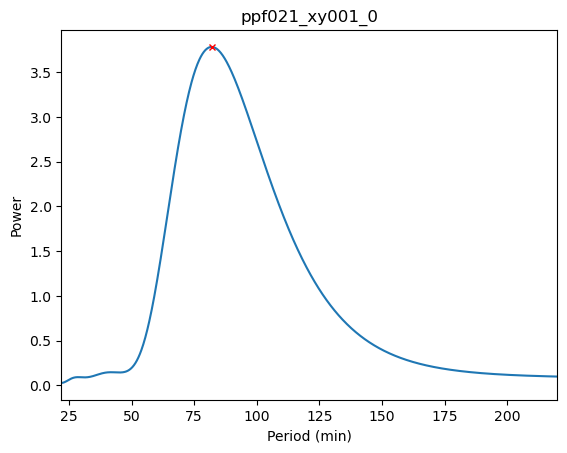

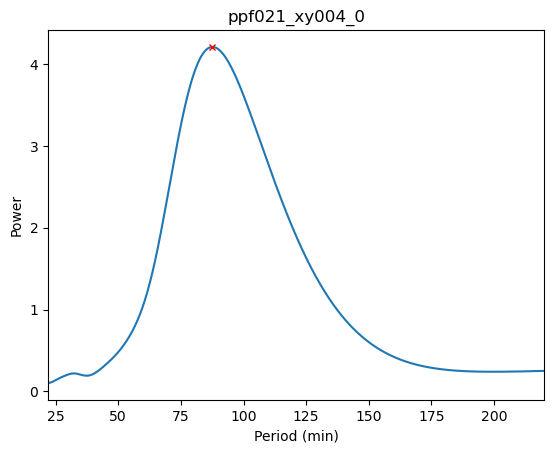

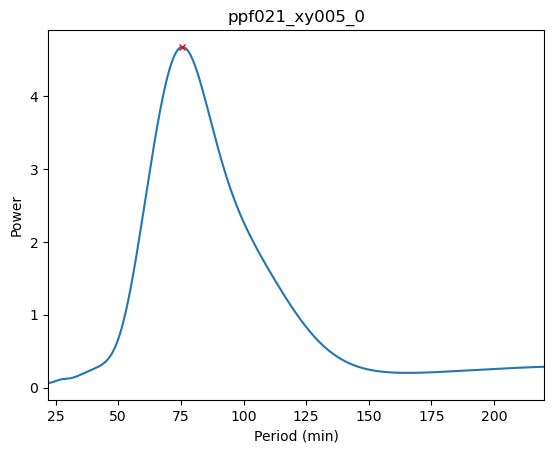

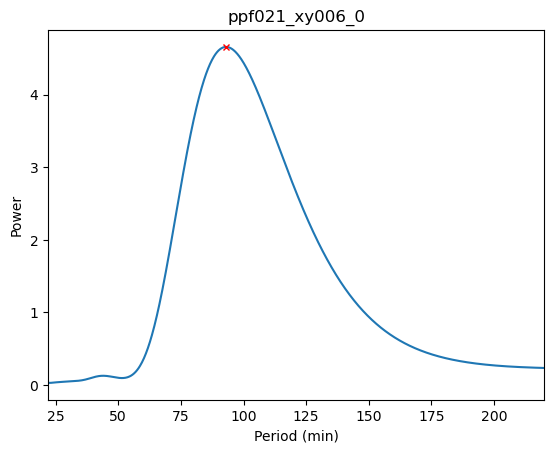

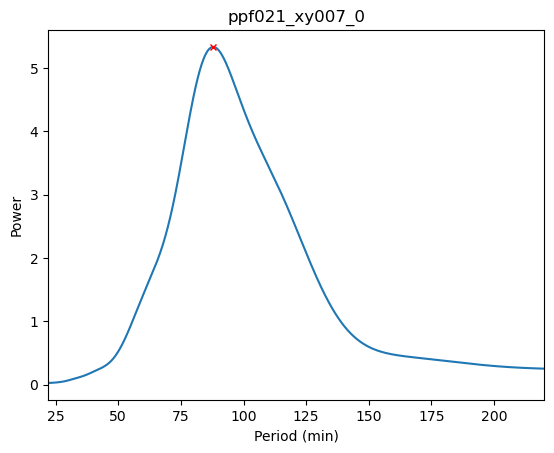

...

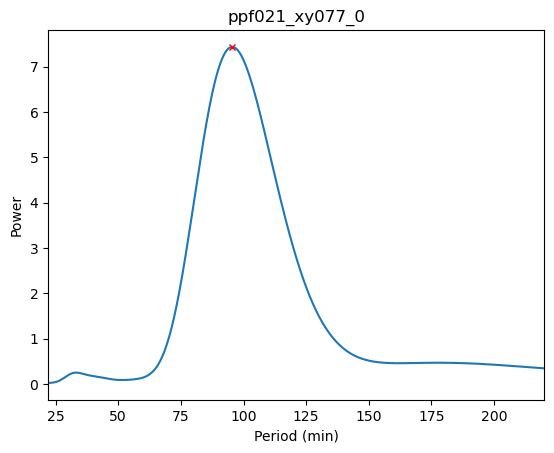

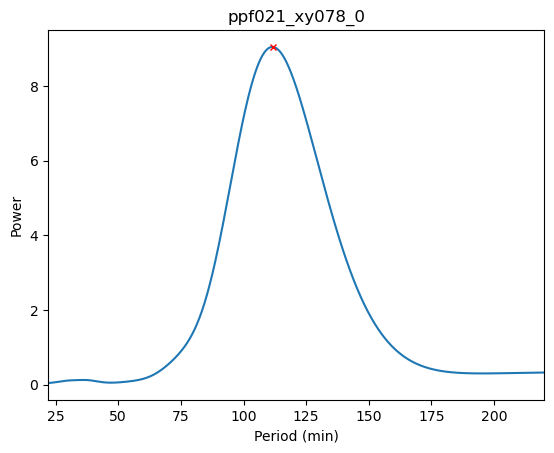

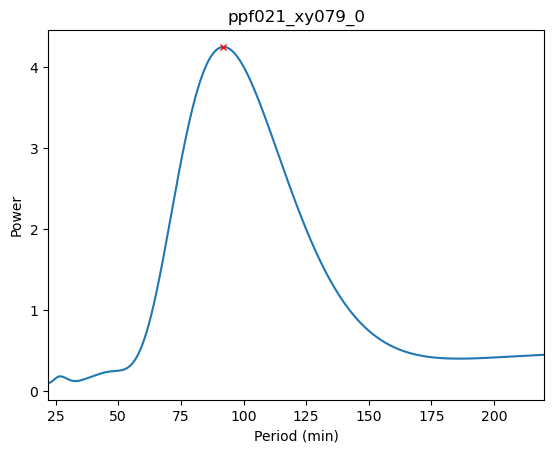

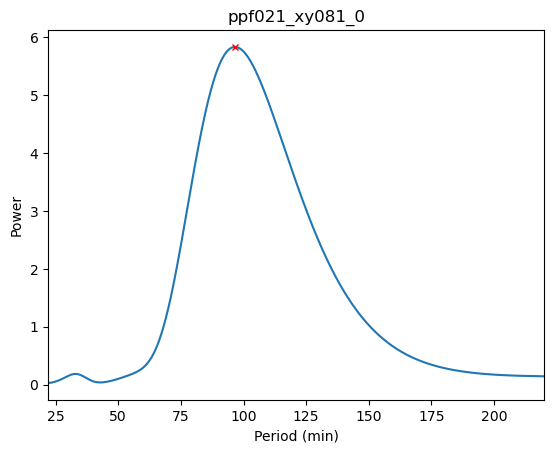

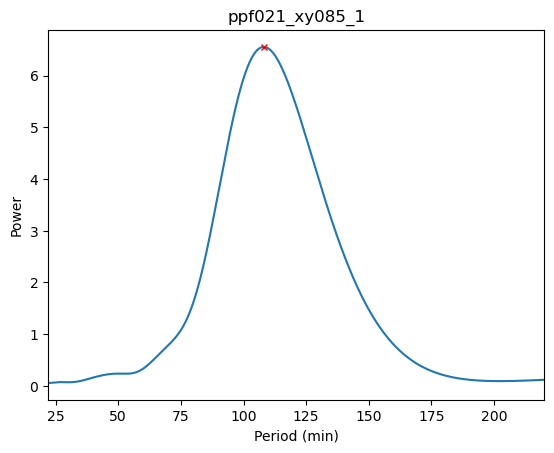

In [51]:
# Fourier of individual signals
check_peaks(signals_control_wp, peaks_control, df_fouriers_control, agg=False)
check_peaks(signals_40nm_wp, peaks_40nm, df_fouriers_40nm, agg=False)
check_peaks(signals_80nm_wp, peaks_80nm, df_fouriers_80nm, agg=False)

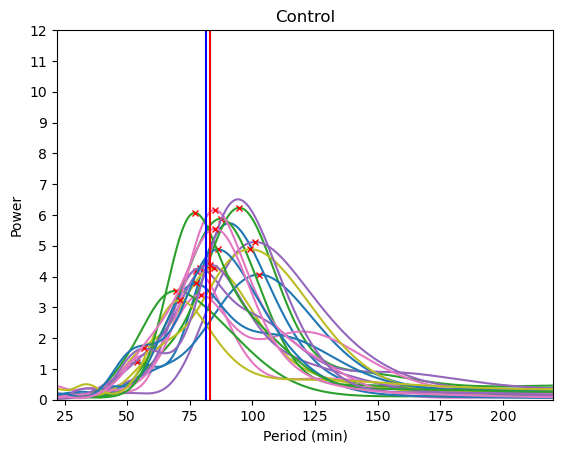

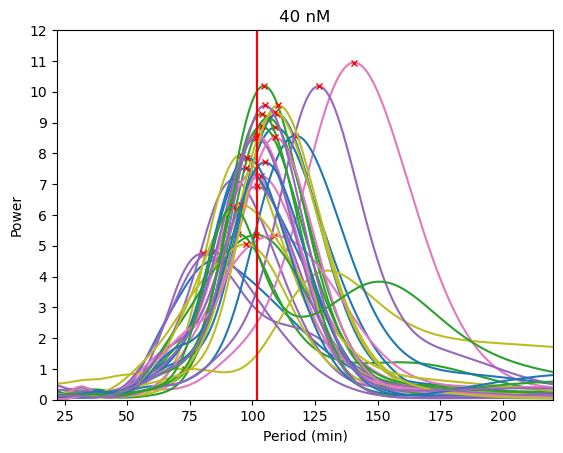

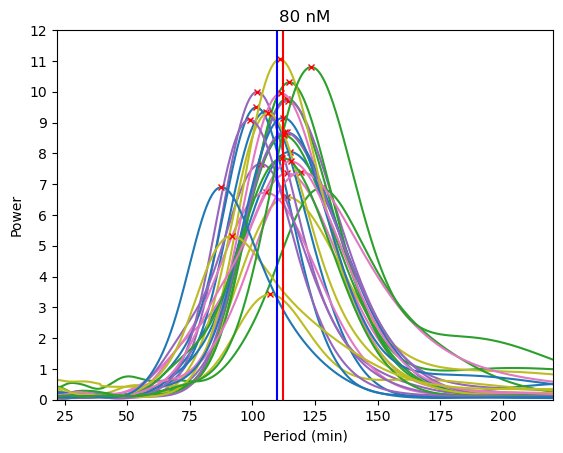

In [24]:
check_peaks(signals_control_wp, peaks_control, df_fouriers_control, agg=True, med_mean=True, title='Control')
check_peaks(signals_40nm_wp, peaks_40nm, df_fouriers_40nm, agg=True, med_mean=True, title='40 nM')
check_peaks(signals_80nm_wp, peaks_80nm, df_fouriers_80nm, agg=True, med_mean=True, title='80 nM')

In [25]:
print(np.mean(peaks_control),
      np.mean(peaks_40nm),
      np.mean(peaks_80nm))

81.58464 101.91591 109.85319



Max. period should be < 176.0
proceeding anyways...

Max. period should be < 209.0
proceeding anyways...

Max. period should be < 198.0
proceeding anyways...

Max. period should be < 176.0
proceeding anyways...

Max. period should be < 209.0
proceeding anyways...


C:\Users\pperez\.conda\envs\devbio-napari-cupy\lib\site-packages\pyboat\plotting.py:260: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = ppl.figure(figsize=(x_size, 6.5))
C:\Users\pperez\.conda\envs\devbio-napari-cupy\lib\site-packages\pyboat\core.py:646: RuntimeWarning: All-NaN slice encountered
  amplitudes = (np.nanmax(rm, axis=1) - np.nanmin(rm, axis=1)) / 2


LinAlgError: SVD did not converge in Linear Least Squares

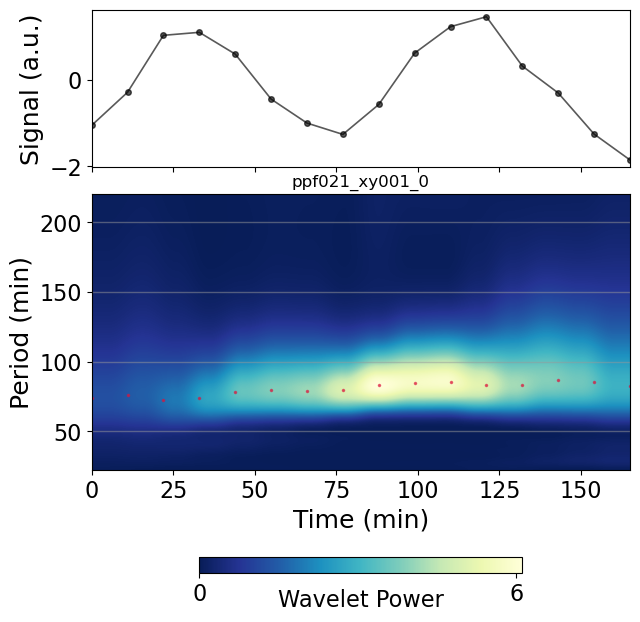

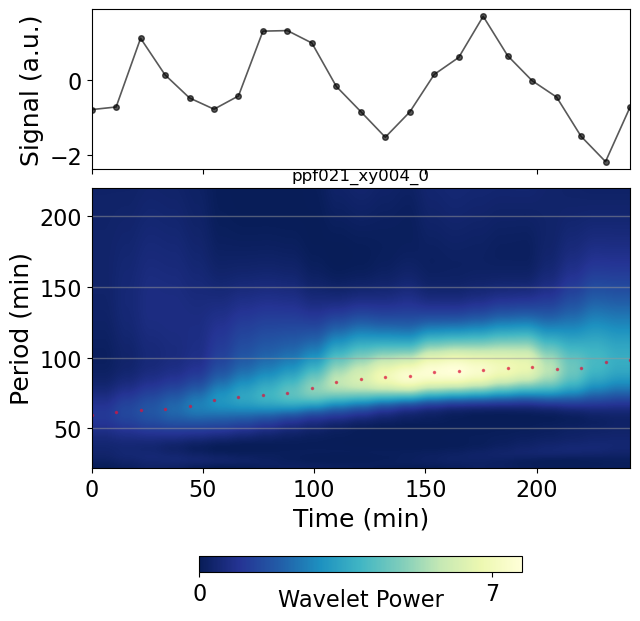

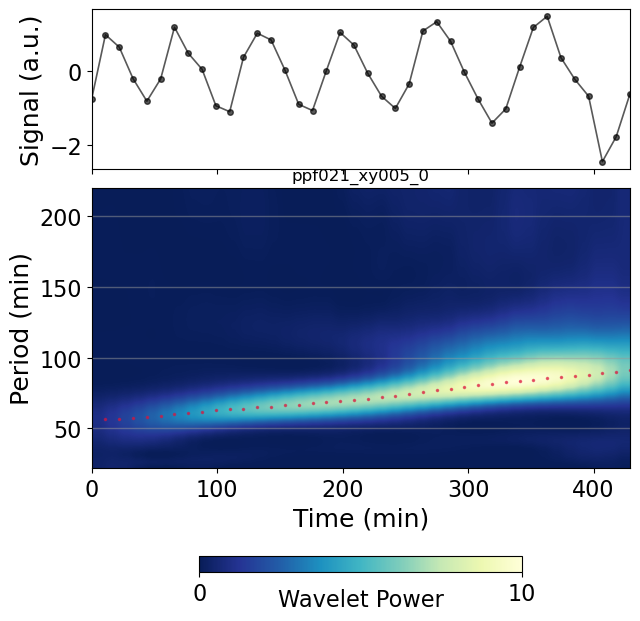

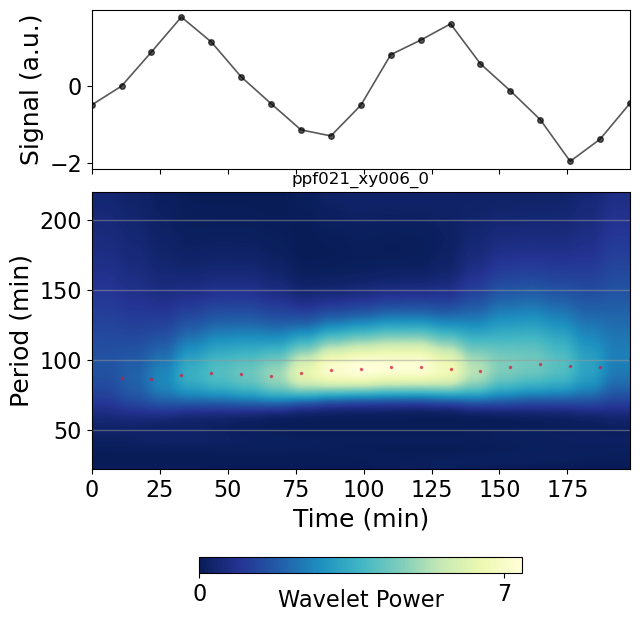

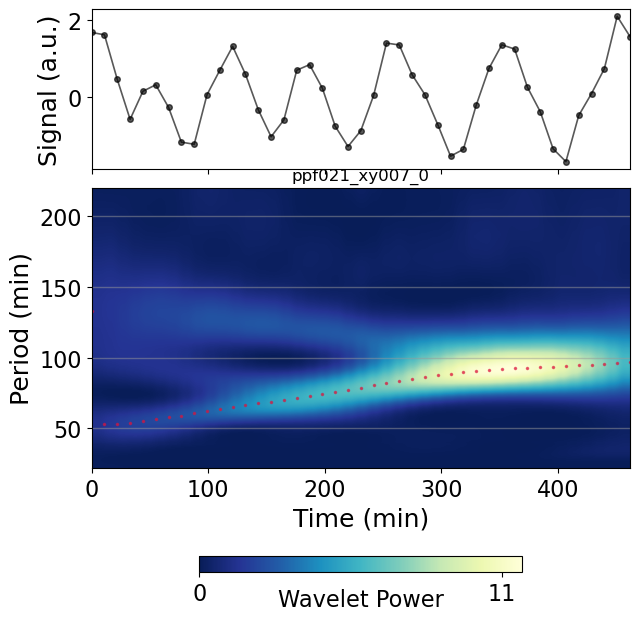

...

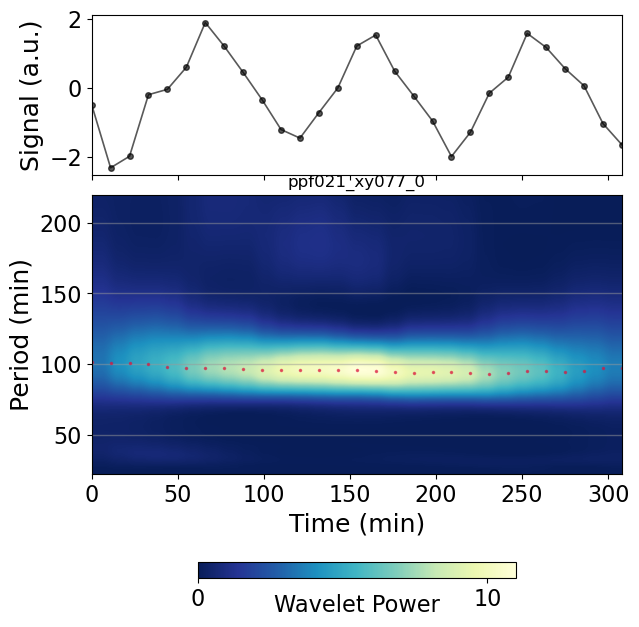

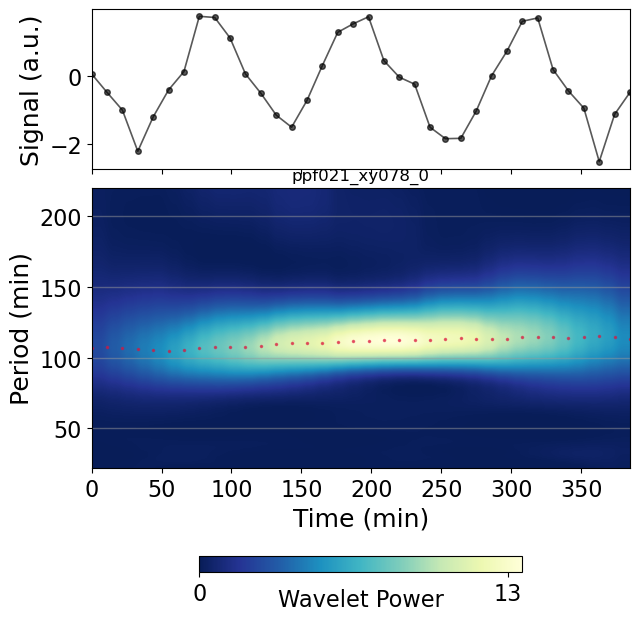

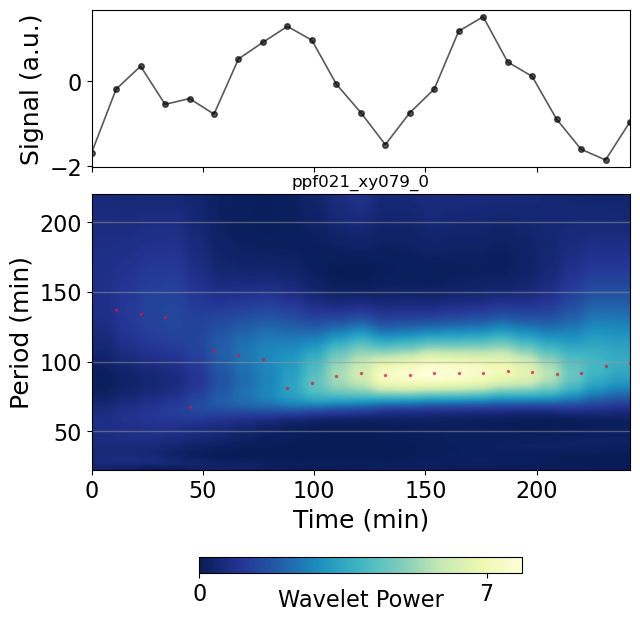

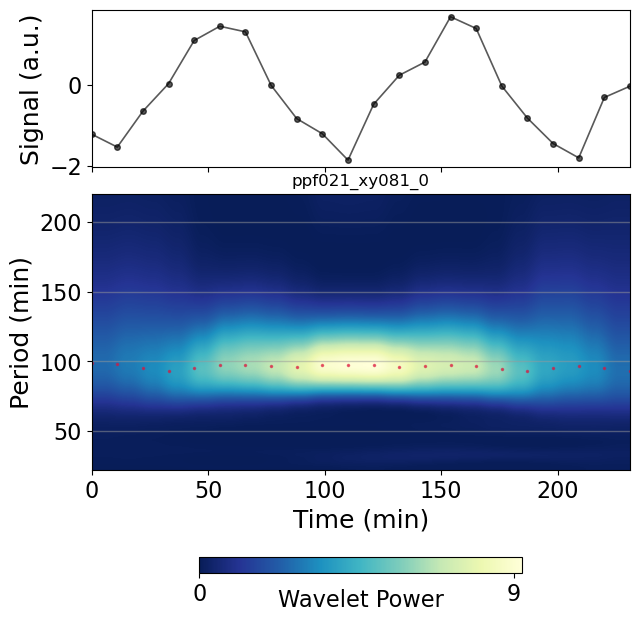

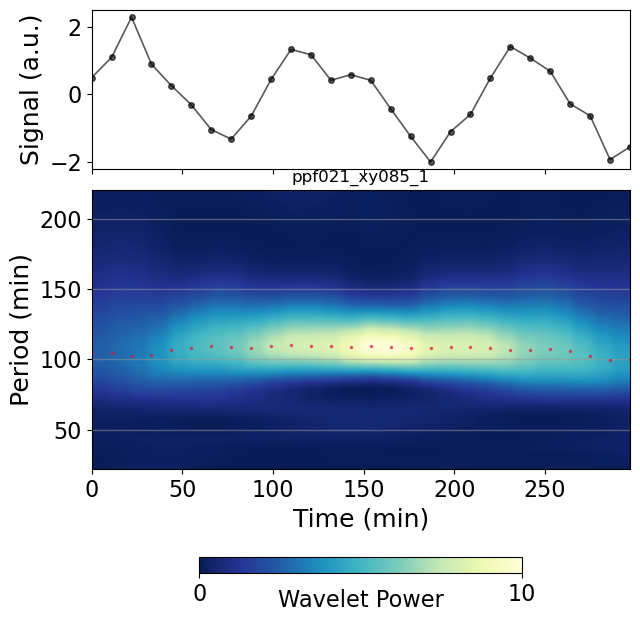

In [56]:
# Reanalyze signals and save plots
_ = analyze_signal_osc(signals_control, df_fouriers=df_fouriers_control, wAn=wAn, save_path='./figures/', plot=True)
_ = analyze_signal_osc(signals_40nm, df_fouriers=df_fouriers_40nm, wAn=wAn, save_path='./figures/', plot=True)
_ = analyze_signal_osc(signals_80nm, df_fouriers=df_fouriers_80nm, wAn=wAn, save_path='./figures/', plot=True)

In [27]:
p = bokeh_catplot.strip(
    data=df_total,
    cats='Condition',
    val='Max. power period (min)',
    horizontal=False,
    jitter=True,
    height=1000,
    width=1400,
    tooltips=[('position', '@{Signal}'), ('period', '@{Max. power period (min)}')]
    
)

p = bokeh_catplot.box(
    data=df_total,
    cats='Condition',
    val='Max. power period (min)',
    horizontal=False,
    whisker_caps=True,
    display_points=False,
    box_kwargs=dict(fill_color=None, line_color='gray'),
    median_kwargs=dict(line_color='gray'),
    whisker_kwargs=dict(line_color='gray'),
    height=1000,
    width=1400,
    p=p,
)

bokeh.io.show(p)

C:\Users\pperez\.conda\envs\devbio-napari-cupy\lib\site-packages\bokeh\io\notebook.py:487: DeprecationWarning: The `source` parameter emit a  deprecation warning since IPython 8.0, it had no effects for a long time and will  be removed in future versions.
  publish_display_data(data, metadata, source, transient=transient, **kwargs)


In [26]:
df_control  = pd.DataFrame(columns=['Signal', 'Condition', 'Max. power period (min)'])

# Iterate over the dictionary
for signal, df in ridges_control.items():
    max_power_row = df.loc[df['power'].idxmax()]  # Get the row with the max 'Power'
    max_power_period = max_power_row['periods']  # Get the corresponding 'periods' value
    df_control = df_control.append({'Signal': signal, 'Condition': 'Control', 'Max. power period (min)': max_power_period}, ignore_index=True)

df_40nm  = pd.DataFrame(columns=['Signal', 'Condition', 'Max. power period (min)'])

# Iterate over the dictionary
for signal, df in ridges_40nm.items():
    max_power_row = df.loc[df['power'].idxmax()]  # Get the row with the max 'Power'
    max_power_period = max_power_row['periods']  # Get the corresponding 'periods' value
    df_40nm = df_40nm.append({'Signal': signal, 'Condition': '40 nM', 'Max. power period (min)': max_power_period}, ignore_index=True)

    
df_80nm  = pd.DataFrame(columns=['Signal', 'Condition', 'Max. power period (min)'])

# Iterate over the dictionary
for signal, df in ridges_80nm.items():
    max_power_row = df.loc[df['power'].idxmax()]  # Get the row with the max 'Power'
    max_power_period = max_power_row['periods']  # Get the corresponding 'periods' value
    df_80nm = df_80nm.append({'Signal': signal, 'Condition': '80 nM', 'Max. power period (min)': max_power_period}, ignore_index=True)


df_total = pd.concat([df_control,df_40nm,df_80nm], ignore_index=True)

C:\Users\pperez\AppData\Local\Temp\14\ipykernel_26948\3928199709.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_control = df_control.append({'Signal': signal, 'Condition': 'Control', 'Max. power period (min)': max_power_period}, ignore_index=True)
C:\Users\pperez\AppData\Local\Temp\14\ipykernel_26948\3928199709.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_control = df_control.append({'Signal': signal, 'Condition': 'Control', 'Max. power period (min)': max_power_period}, ignore_index=True)
C:\Users\pperez\AppData\Local\Temp\14\ipykernel_26948\3928199709.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_control = df_control.append({'Signal': signal, 'Condition': 'Control', 'Max. power period (min)': max

In [99]:
df_total

,Signal,Condition,Max. power period (min)
0,ppf021_xy001_0,Control,84.432432
1,ppf021_xy004_0,Control,92.954955
2,ppf021_xy005_0,Control,85.621622
3,ppf021_xy006_0,Control,97.909910
4,ppf021_xy007_0,Control,93.549550
...,...,...,...
61,ppf021_xy102_0,80 nM,100.090090
62,ppf021_xy104_0,80 nM,97.909910
63,ppf021_xy105_0,80 nM,96.522523
64,ppf021_xy107_0,80 nM,123.477477


In [21]:
print("Control sample size:", len(df_total.loc[df_total['Condition']=='Control']))
print("40 nM sample size:", len(df_total.loc[df_total['Condition']=='40 nM']))
print("80 nM sample size:", len(df_total.loc[df_total['Condition']=='80 nM']))

Control sample size: 13
40 nM sample size: 17
80 nM sample size: 14


In [341]:
df_total = df_total[df_total['Max. power period (min)']>60]

In [29]:
from bokeh.io import export_svgs

p = bokeh_catplot.strip(
    data=df_mean,
    cats='Condition',
    val='Max. power period (min)',
    horizontal=False,
    jitter=True,
    height=1000,
    width=1400,
    tooltips=[('position', '@{Signal}'), ('period', '@{Max. power period (min)}')]
    
)

p = bokeh_catplot.box(
    data=df_mean,
    cats='Condition',
    val='Max. power period (min)',
    horizontal=False,
    whisker_caps=True,
    display_points=False,
    box_kwargs=dict(fill_color=None, line_color='gray'),
    median_kwargs=dict(line_color='gray'),
    whisker_kwargs=dict(line_color='gray'),
    height=1000,
    width=1400,
    p=p,
)

p.legend.label_text_font_size = '16pt'
p.xaxis.axis_label = 'Max. power period (min)'
p.xaxis.axis_label_text_font_size='16pt'
p.yaxis.major_label_text_font_size  = '16pt'
p.xaxis.major_label_text_font_size = '14pt'
p.output_backend='svg'
# bokeh.io.export_svgs(p,filename='./periods_amanitin.svg')
bokeh.io.show(p)

C:\Users\pperez\.conda\envs\devbio-napari-cupy\lib\site-packages\bokeh\models\plots.py:815: UserWarning: 
You are attempting to set `plot.legend.label_text_font_size` on a plot that has zero legends added, this will have no effect.

Before legend properties can be set, you must add a Legend explicitly, or call a glyph method with a legend parameter set.

  warnings.warn(_LEGEND_EMPTY_WARNING % attr)
C:\Users\pperez\.conda\envs\devbio-napari-cupy\lib\site-packages\bokeh\io\notebook.py:487: DeprecationWarning: The `source` parameter emit a  deprecation warning since IPython 8.0, it had no effects for a long time and will  be removed in future versions.
  publish_display_data(data, metadata, source, transient=transient, **kwargs)


In [44]:
df_total=df_total[df_total['Max. power period (min)'] >= 40]
df_total=df_total[df_total['Max. power period (min)'] <= 160]

In [45]:
df_mean=df_mean[df_mean['Max. power period (min)'] <= 160]


In [30]:
df_total.groupby('Condition')['Max. power period (min)'].mean()

Condition
40 nM      103.867868
80 nM      108.076743
Control     83.094595
Name: Max. power period (min), dtype: float64

In [347]:
df_median.groupby('Condition')['Max. power period (min)'].mean()

Condition
40 nM      116.613823
80 nM      113.991298
Control     99.324749
Name: Max. power period (min), dtype: float64

In [137]:
df_control_median = pd.DataFrame(columns=['Signal', 'Condition', 'Max. power period (min)'])

# Iterate over the dictionary
for signal, df in ridges_control.items():
    # Sort the DataFrame by 'Power'
    sorted_df = df.sort_values(by='power').reset_index(drop=True)
    
    # Get the median value of 'Power'
    median_power = sorted_df['power'].median()
    
    # Find the row where 'Power' is closest to the median value
    median_power_row = sorted_df.iloc[(sorted_df['power'] - median_power).abs().argsort()[:1]].iloc[0]
    
    # Get the corresponding 'periods' value
    median_power_period = median_power_row['periods']
    
    # Add the new row to the new DataFrame
    df_control_median = df_control_median.append({'Signal': signal, 'Condition': 'Control', 'Max. power period (min)': median_power_period}, ignore_index=True)

# Display the new DataFrame

df_40_median = pd.DataFrame(columns=['Signal', 'Condition', 'Max. power period (min)'])

# Iterate over the dictionary
for signal, df in ridges_40nm.items():
    # Sort the DataFrame by 'Power'
    sorted_df = df.sort_values(by='power').reset_index(drop=True)
    
    # Get the median value of 'Power'
    median_power = sorted_df['power'].median()
    
    # Find the row where 'Power' is closest to the median value
    median_power_row = sorted_df.iloc[(sorted_df['power'] - median_power).abs().argsort()[:1]].iloc[0]
    
    # Get the corresponding 'periods' value
    median_power_period = median_power_row['periods']
    
    # Add the new row to the new DataFrame
    df_40_median = df_40_median.append({'Signal': signal, 'Condition': '40 nM', 'Max. power period (min)': median_power_period}, ignore_index=True)


df_120_median = pd.DataFrame(columns=['Signal', 'Condition', 'Max. power period (min)'])
for signal, df in ridges_120nm.items():
    # Sort the DataFrame by 'Power'
    sorted_df = df.sort_values(by='power').reset_index(drop=True)
    
    # Get the median value of 'Power'
    median_power = sorted_df['power'].median()
    
    # Find the row where 'Power' is closest to the median value
    median_power_row = sorted_df.iloc[(sorted_df['power'] - median_power).abs().argsort()[:1]].iloc[0]
    
    # Get the corresponding 'periods' value
    median_power_period = median_power_row['periods']
    
    # Add the new row to the new DataFrame
    df_120_median = df_120_median.append({'Signal': signal, 'Condition': '120 nM', 'Max. power period (min)': median_power_period}, ignore_index=True)

df_median = pd.concat([df_control_median, df_40_median, df_120_median])

C:\Users\pperez\AppData\Local\Temp\1\ipykernel_17800\2803077232.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_control_median = df_control_median.append({'Signal': signal, 'Condition': 'Control', 'Max. power period (min)': median_power_period}, ignore_index=True)
C:\Users\pperez\AppData\Local\Temp\1\ipykernel_17800\2803077232.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_control_median = df_control_median.append({'Signal': signal, 'Condition': 'Control', 'Max. power period (min)': median_power_period}, ignore_index=True)
C:\Users\pperez\AppData\Local\Temp\1\ipykernel_17800\2803077232.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_control_median = df_control_median.append({'Signal': signal, 'Condi

In [28]:
df_control_mean = pd.DataFrame(columns=['Signal', 'Condition', 'Max. power period (min)'])
df_40_mean = pd.DataFrame(columns=['Signal', 'Condition', 'Max. power period (min)'])
df_80_mean = pd.DataFrame(columns=['Signal', 'Condition', 'Max. power period (min)'])


# Function to calculate the mean 'periods' and update the DataFrame
def calculate_mean_period(ridges_dict, condition):
    df_mean = pd.DataFrame(columns=['Signal', 'Condition', 'Max. power period (min)'])
    for signal, df in ridges_dict.items():
        mean_period = df['periods'].mean()
        df_mean = df_mean.append({'Signal': signal, 'Condition': condition, 'Max. power period (min)': mean_period}, ignore_index=True)
    return df_mean

# Calculate mean periods for each condition
df_control_mean = calculate_mean_period(ridges_control, 'Control')
df_40_mean = calculate_mean_period(ridges_40nm, '40 nM')
df_80_mean = calculate_mean_period(ridges_80nm, '80 nM')

# Concatenate all the DataFrames
df_mean = pd.concat([df_control_mean, df_40_mean, df_80_mean])

# Display the final DataFrame
print(df_mean)

            Signal Condition  Max. power period (min)
0   ppf025_xy001_0   Control                78.121385
1   ppf025_xy002_0   Control                83.723874
2   ppf025_xy003_0   Control               102.495495
3   ppf025_xy006_0   Control                78.128205
4   ppf025_xy007_0   Control                70.783183
..             ...       ...                      ...
22  ppf025_xy097_0     80 nM                97.221722
23  ppf025_xy098_0     80 nM               104.591476
24  ppf025_xy099_0     80 nM                90.444444
25  ppf025_xy100_0     80 nM                84.933433
26  ppf025_xy101_0     80 nM               121.240189

[80 rows x 3 columns]


C:\Users\pperez\AppData\Local\Temp\14\ipykernel_26948\2265921146.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_mean = df_mean.append({'Signal': signal, 'Condition': condition, 'Max. power period (min)': mean_period}, ignore_index=True)
C:\Users\pperez\AppData\Local\Temp\14\ipykernel_26948\2265921146.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_mean = df_mean.append({'Signal': signal, 'Condition': condition, 'Max. power period (min)': mean_period}, ignore_index=True)
C:\Users\pperez\AppData\Local\Temp\14\ipykernel_26948\2265921146.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_mean = df_mean.append({'Signal': signal, 'Condition': condition, 'Max. power period (min)': mean_period}, ignore_index=T

In [31]:
df_list = []

# Iterate over the dictionary
for signal, df in ridges_control.items():
    df_copy = df.copy(deep=True)  # Copy the DataFrame to avoid modifying the original
    df_copy['Signal'] = signal  # Add the extra column with the key name
    df_list.append(df_copy)  # Append the modified DataFrame to the list

# Concatenate all DataFrames into a single DataFrame
combined_df_control = pd.concat(df_list, ignore_index=True)

In [32]:
df_list = []

# Iterate over the dictionary
for signal, df in ridges_40nm.items():
    df_copy = df.copy(deep=True)  # Copy the DataFrame to avoid modifying the original
    df_copy['Signal'] = signal  # Add the extra column with the key name
    df_list.append(df_copy)  # Append the modified DataFrame to the list

# Concatenate all DataFrames into a single DataFrame
combined_df_40nm = pd.concat(df_list, ignore_index=True)

In [33]:
df_list = []

# Iterate over the dictionary
for signal, df in ridges_80nm.items():
    df_copy = df.copy(deep=True)  # Copy the DataFrame to avoid modifying the original
    df_copy['Signal'] = signal  # Add the extra column with the key name
    df_list.append(df_copy)  # Append the modified DataFrame to the list

# Concatenate all DataFrames into a single DataFrame
combined_df_80nm = pd.concat(df_list, ignore_index=True)

In [34]:
ridges_total_df = pd.concat([combined_df_control, combined_df_40nm, combined_df_80nm])
ridges_total_df.to_csv('./ridges_ppf025')

In [100]:
df_total['Condition'].unique()

array(['Control', '40 nM', '120 nM'], dtype=object)

In [146]:
from bokeh.transform import jitter
from io import BytesIO
from bokeh.models import Div, Legend, ResetTool
import base64

df_plot = df_total.copy(deep=True)
categories = df_plot['Condition'].unique()
colors = [bokeh.palettes.d3['Category20'][5][0],
        bokeh.palettes.d3['Category20'][5][-1],
        bokeh.palettes.d3['Category20'][5][-3]]



category_colors = dict(zip(categories, colors))
df_plot['color'] = df_plot['Condition'].map(category_colors)
source = ColumnDataSource(df_plot)
p = figure(width=900, height=800, x_range=df_total['Condition'].unique(),
          tools=[TapTool(), BoxZoomTool(), ResetTool()])



# categories = 
# experiments = 
# p.circle(x='Max. power period (min)', y=jitter('Condition', width=0.6, range=p.y_range),  source=source, alpha=1.0, legend_field='Condition', color='color', nonselection_alpha=1.0)
p.circle(x=jitter('Condition', width=0.20, range=p.x_range), y='Max. power period (min)',  source=source, alpha=1.0, legend_group='Condition', color='color', nonselection_alpha=1.0)


image_div = Div(text='', width=800, height=800)

def tapping(attr, old, new):
    try:
        selected_index = source.selected.indices[0]
        #print(f"Clicked on point at index {selected_index}")
        
        # Display an image associated with the point index
        image_path = './figures/'+df_total.iloc[selected_index, 0]+'.png'
    
        with open(image_path, "rb") as f:
            image_data = base64.b64encode(f.read()).decode("utf-8")

        # Update the content of the Div widget with the new image
        image_div.text = f'<img src="data:image/png;base64,{image_data}" width="800" height="800">'
    except IndexError:
        pass

    
# Change the selected index by Tapping
source.selected.on_change('indices', tapping)


# Change font size of axes
p.xaxis.major_label_text_font_size = '14pt'
p.yaxis.major_label_text_font_size = '14pt'
p.xaxis.axis_label = 'Condition'
p.yaxis.axis_label = 'Period (min)'

#Change title
p.title.text = 'Period vs CHX concentration'
p.title.text_font_size = '16pt'
p.title.align = 'center'

norm_layout = bokeh.layouts.row(
    p,
    bokeh.models.Spacer(height=15),
    image_div
)
# Add layout to the current document
def norm_app(doc):
    doc.add_root(norm_layout)

notebook_url = 'localhost:8890'
bokeh.io.show(norm_app, notebook_url=notebook_url)

#output_file('interactive_categorical_strip_plot.html')
#show(p)

INFO:bokeh.server.server:Starting Bokeh server version 2.4.3 (running on Tornado 6.4)
INFO:bokeh.server.tornado:User authentication hooks NOT provided (default user enabled)
C:\Users\pperez\.conda\envs\devbio-napari-cupy\lib\site-packages\bokeh\io\notebook.py:487: DeprecationWarning: The `source` parameter emit a  deprecation warning since IPython 8.0, it had no effects for a long time and will  be removed in future versions.
  publish_display_data(data, metadata, source, transient=transient, **kwargs)


INFO:tornado.access:200 GET /autoload.js?bokeh-autoload-element=5769&bokeh-absolute-url=http://localhost:56760&resources=none (::1) 36.03ms
INFO:tornado.access:101 GET /ws (::1) 2.04ms
INFO:bokeh.server.views.ws:WebSocket connection opened
INFO:bokeh.server.views.ws:ServerConnection created


In [143]:
df_total = df_total.drop(df_total.loc[df_total['Signal'] == 'ppf008_xy022_1',:].index)
df_median = df_median.drop(df_median.loc[df_median['Signal'] == 'ppf008_xy022_1',:].index)
df_mean = df_mean.drop(df_median.loc[df_mean['Signal'] == 'ppf008_xy027_0',:].index)

In [140]:
df_total = df_total.drop(df_total.loc[df_total['Signal'] == 'ppf008_xy021_0',:].index)
df_median = df_median.drop(df_median.loc[df_median['Signal'] == 'ppf008_xy021_0',:].index)
df_mean = df_mean.drop(df_mean.loc[df_mean['Signal'] == 'ppf008_xy027_0',:].index)

In [141]:
df_total = df_total.drop(df_total.loc[df_total['Signal'] == 'ppf008_xy039_0',:].index)
df_median = df_median.drop(df_median.loc[df_median['Signal'] == 'ppf008_xy039_0',:].index)
df_mean = df_mean.drop(df_mean.loc[df_mean['Signal'] == 'ppf008_xy027_0',:].index)

In [142]:
df_total = df_total.drop(df_total.loc[df_total['Signal'] == 'ppf008_xy027_0',:].index)
df_median = df_median.drop(df_median.loc[df_median['Signal'] == 'ppf008_xy027_0',:].index)
df_mean = df_mean.drop(df_mean.loc[df_mean['Signal'] == 'ppf008_xy027_0',:].index)

In [158]:
ridges_control={key:ridges_control[key] for key in df_total.loc[df_total['Condition']=='Control','Signal'].unique()}

In [159]:
ridges_40nm={key:ridges_40nm[key] for key in df_total.loc[df_total['Condition']=='40 nM','Signal'].unique()}

In [160]:
ridges_120nm={key:ridges_120nm[key] for key in df_total.loc[df_total['Condition']=='120 nM','Signal'].unique()}

In [374]:
plt.plot(signals_40nm['ppf')

In [148]:
from scipy.stats import linregress

In [149]:
slopes_dict_control = {}

# Compute the regression line for each series
for name, df in ridges_control.items():
    x = np.arange(len(df))  # Assuming x values are indices of the series
    x_min = x*15
    y = df['periods'].values
    slope, intercept, r_value, p_value, std_err = linregress(x, y)
    slopes_dict_control[name] = slope

# Convert the slopes dictionary to a DataFrame for better presentation
slopes_df_control = pd.DataFrame(list(slopes_dict_control.items()), columns=['Series', 'Slope'])
slopes_df_control['Condition']='Control'
# Display the slopes DataFrame
print(slopes_df_control)

            Series     Slope Condition
0   ppf008_xy003_1  2.932543   Control
1   ppf008_xy004_0  1.896516   Control
2   ppf008_xy006_0  2.839141   Control
3   ppf008_xy007_0  0.661878   Control
4   ppf008_xy007_1  1.492060   Control
5   ppf008_xy009_0  0.887893   Control
6   ppf008_xy010_0  3.314208   Control
7   ppf008_xy012_0  1.668910   Control
8   ppf008_xy013_0  2.264958   Control
9   ppf008_xy014_0  2.359338   Control
10  ppf008_xy015_0  2.693282   Control
11  ppf008_xy015_1  1.900464   Control
12  ppf008_xy016_0  0.509574   Control
13  ppf008_xy017_0  2.778735   Control
14  ppf008_xy018_0  0.734083   Control
15  ppf008_xy019_0  2.283916   Control
16  ppf008_xy020_0  1.226793   Control
17  ppf008_xy021_0  2.854727   Control
18  ppf008_xy022_1  2.133412   Control
19  ppf008_xy024_0  0.915313   Control
20  ppf008_xy025_0  2.128472   Control
21  ppf008_xy027_0 -4.627190   Control
22  ppf008_xy028_0  3.271095   Control
23  ppf008_xy029_0  0.993916   Control
24  ppf008_xy031_0  2.590

In [150]:
slopes_dict_40nm = {}

# Compute the regression line for each series
for name, df in ridges_40nm.items():
    x = np.arange(len(df))  # Assuming x values are indices of the series
    x_min = x*15
    y = df['periods'].values
    slope, intercept, r_value, p_value, std_err = linregress(x, y)
    slopes_dict_40nm[name] = slope

# Convert the slopes dictionary to a DataFrame for better presentation
slopes_df_40nm = pd.DataFrame(list(slopes_dict_40nm.items()), columns=['Series', 'Slope'])
slopes_df_40nm['Condition']='40 nM'
# Display the slopes DataFrame
print(slopes_df_40nm)

            Series     Slope Condition
0   ppf008_xy054_0 -0.360515     40 nM
1   ppf008_xy057_0  2.109779     40 nM
2   ppf008_xy061_0 -1.064122     40 nM
3   ppf008_xy063_0  0.265302     40 nM
4   ppf008_xy064_0  1.768814     40 nM
5   ppf008_xy065_0  1.362859     40 nM
6   ppf008_xy065_1  0.528481     40 nM
7   ppf008_xy068_0  1.941553     40 nM
8   ppf008_xy070_0  2.621731     40 nM
9   ppf008_xy070_1  1.627970     40 nM
10  ppf008_xy074_0  1.540283     40 nM
11  ppf008_xy075_0  0.525337     40 nM
12  ppf008_xy077_0  0.631633     40 nM
13  ppf008_xy078_0  2.567426     40 nM
14  ppf008_xy080_0  1.285173     40 nM
15  ppf008_xy082_0  2.974774     40 nM
16  ppf008_xy084_0  1.380216     40 nM
17  ppf008_xy086_0  1.931549     40 nM
18  ppf008_xy087_0  1.049595     40 nM
19  ppf008_xy088_0 -2.087735     40 nM
20  ppf008_xy089_0 -0.799973     40 nM
21  ppf008_xy090_0  1.050124     40 nM
22  ppf008_xy092_0  1.623060     40 nM
23  ppf008_xy094_0  1.269970     40 nM
24  ppf008_xy098_0  0.104

In [172]:
slopes_dict_120nm = {}

# Compute the regression line for each series
for name, df in ridges_120nm.items():
    x = np.arange(len(df))  # Assuming x values are indices of the series
    x_min = x*15
    y = df['periods'].values
    slope, intercept, r_value, p_value, std_err = linregress(x, y)
    slopes_dict_120nm[name] = slope

# Convert the slopes dictionary to a DataFrame for better presentation
slopes_df_120nm = pd.DataFrame(list(slopes_dict_120nm.items()), columns=['Series', 'Slope'])
slopes_df_120nm['Condition']='120 nM'
# Display the slopes DataFrame
print(slopes_df_120nm)

            Series     Slope Condition
0   ppf008_xy115_0  1.170811    120 nM
1   ppf008_xy116_0  1.134866    120 nM
2   ppf008_xy117_0  1.754579    120 nM
3   ppf008_xy117_1 -1.108883    120 nM
4   ppf008_xy118_0 -0.105563    120 nM
5   ppf008_xy119_0 -2.705659    120 nM
6   ppf008_xy122_0 -0.352798    120 nM
7   ppf008_xy124_0  0.514585    120 nM
8   ppf008_xy126_0 -2.518427    120 nM
9   ppf008_xy129_0  0.697327    120 nM
10  ppf008_xy130_0 -0.295567    120 nM
11  ppf008_xy132_0  0.593500    120 nM
12  ppf008_xy134_0  1.586073    120 nM
13  ppf008_xy135_0 -0.802065    120 nM
14  ppf008_xy136_0  0.838399    120 nM
15  ppf008_xy136_1  1.134750    120 nM
16  ppf008_xy138_0  0.361579    120 nM
17  ppf008_xy147_0 -0.989795    120 nM
18  ppf008_xy148_0  1.456809    120 nM
19  ppf008_xy151_0  2.419450    120 nM
20  ppf008_xy151_2  0.134458    120 nM
21  ppf008_xy151_1  1.217887    120 nM
22  ppf008_xy152_0  1.373364    120 nM
23  ppf008_xy153_0  1.369983    120 nM
24  ppf008_xy154_0 -0.062

In [170]:
slopes_df_120nm['Slope'].mean()

nan

In [173]:
slopes_df = pd.concat([slopes_df_control, slopes_df_40nm, slopes_df_120nm])

In [156]:
slopes_df=slopes_df[slopes_df['Slope']>=-2]

In [157]:
from bokeh.io import export_svgs

p = bokeh_catplot.strip(
    data=slopes_df,
    cats='Condition',
    val='Slope',
    horizontal=False,
    jitter=True,
    height=650,
    width=850,
#     tooltips=[('Position', '@{Signal}'),
#              ('Period', '@{Max. power period (min)}')]
    
)

p = bokeh_catplot.box(
    data=slopes_df,
    cats='Condition',
    val='Slope',
    horizontal=False,
    whisker_caps=True,
    display_points=False,
    box_kwargs=dict(fill_color=None, line_color='gray'),
    median_kwargs=dict(line_color='gray'),
    whisker_kwargs=dict(line_color='gray'),
    height=650,
    width=850,
    p=p,
)


p.output_backend = "svg"
# p.legend.title = 'Statistics'
# p.legend.location = 'top_right'
p.legend.label_text_font_size = '16pt'
p.xaxis.axis_label = 'Change rate of period per time step (min)'
p.xaxis.axis_label_text_font_size='16pt'
p.yaxis.major_label_text_font_size  = '16pt'
p.xaxis.major_label_text_font_size = '14pt'
export_svgs(p, filename="./rate_of_change_period_ppf008.svg")
bokeh.io.show(p)

C:\Users\pperez\.conda\envs\devbio-napari-cupy\lib\site-packages\bokeh\models\plots.py:815: UserWarning: 
You are attempting to set `plot.legend.label_text_font_size` on a plot that has zero legends added, this will have no effect.

Before legend properties can be set, you must add a Legend explicitly, or call a glyph method with a legend parameter set.

  warnings.warn(_LEGEND_EMPTY_WARNING % attr)
C:\Users\pperez\.conda\envs\devbio-napari-cupy\lib\site-packages\bokeh\io\notebook.py:487: DeprecationWarning: The `source` parameter emit a  deprecation warning since IPython 8.0, it had no effects for a long time and will  be removed in future versions.
  publish_display_data(data, metadata, source, transient=transient, **kwargs)


In [201]:
import pandas as pd
import bokeh_catplot as bcp
import bokeh.io


# Create a summary DataFrame with unique rows
summary_df = total_ridges[['Experiment', 'Condition', 'Max. power period (min)']].drop_duplicates()

# Strip plot
p = bcp.strip(
    data=summary_df,
    cats=['Condition'],
    val='Max. power period (min)',
    horizontal=False,
    jitter=True,
    height=650,
    width=850
)

# Box plot
p = bcp.box(
    data=summary_df,
    cats=['Condition'],
    val='Max. power period (min)',
    horizontal=False,
    whisker_caps=True,
    display_points=False,
    box_kwargs=dict(fill_color=None, line_color='gray'),
    median_kwargs=dict(line_color='gray'),
    whisker_kwargs=dict(line_color='gray'),
    height=650,
    width=850,
    p=p
)

# Show the plot
p.output_backend = "svg"
# p.legend.title = 'Statistics'
# p.legend.location = 'top_right'
p.legend.label_text_font_size = '16pt'
p.xaxis.axis_label = 'Max. power period (min)'
p.xaxis.axis_label_text_font_size='16pt'
p.yaxis.major_label_text_font_size  = '16pt'
p.xaxis.major_label_text_font_size = '14pt'
export_svgs(p, filename="./Max_power_period_CHX.svg")
bokeh.io.show(p)

C:\Users\pperez\.conda\envs\devbio-napari-cupy\lib\site-packages\bokeh\models\plots.py:815: UserWarning: 
You are attempting to set `plot.legend.label_text_font_size` on a plot that has zero legends added, this will have no effect.

Before legend properties can be set, you must add a Legend explicitly, or call a glyph method with a legend parameter set.

  warnings.warn(_LEGEND_EMPTY_WARNING % attr)
C:\Users\pperez\.conda\envs\devbio-napari-cupy\lib\site-packages\bokeh\io\notebook.py:487: DeprecationWarning: The `source` parameter emit a  deprecation warning since IPython 8.0, it had no effects for a long time and will  be removed in future versions.
  publish_display_data(data, metadata, source, transient=transient, **kwargs)


In [167]:
ridges_ppf005=pd.read_csv('./ridges_ppf005', index_col=0)

In [178]:
peak_data_ppf005 = pd.read_csv('./peak_data_ppf005', index_col=0)

In [174]:
ridges_ppf005['Experiment']='ppf005'
ridges_ppf005['Drug'] = 'CHX'

In [53]:
peak_data = pd.read_csv('./peak_data_ppf020', index_col=0)

In [60]:
duplicated_peak = peak_data.copy(deep=True)

In [181]:
mapping_condition = peak_data_ppf005.set_index('Signal')['Condition'].to_dict()
ridges_ppf005['Condition'] = ridges_ppf005['Signal'].map(mapping_condition)

In [57]:
duplicated_peak['Peak pos rank'] = duplicated_peak.groupby('Signal')['Peak pos'].rank(ascending=False, method='min').astype(int) - 1

# Initialize an empty dictionary to store correlations
correlations = {}

# Compute the correlation for each 'Signal'
for signal in duplicated_peak['Signal'].unique():
    signal_df = duplicated_peak[correlation_df['Signal'] == signal]
    correlation = signal_df['Peak pos rank'].corr(signal_df['Peak heights'])
    correlations[signal] = correlation

# Convert the correlations dictionary to a DataFrame for better presentation
correlations_df = pd.DataFrame(list(correlations.items()), columns=['Signal', 'Correlation'])

# Display the DataFrame with the rankings and the correlations
print(df)
print("\nCorrelations between 'Peak pos rank' and 'Peak heights':")
print(correlations_df)

In [59]:
duplicated_peak['Peak pos rank'] = duplicated_peak.groupby('Signal')['Peak pos'].rank(ascending=False, method='min').astype(int) - 1

# Initialize a list to store correlations with conditions
correlations_with_conditions = []

# Group by 'Condition' and compute correlations for each group
for condition, group in duplicated_peak.groupby('Condition'):
    condition_correlations = {}
    
    for signal in group['Signal'].unique():
        signal_df = group[group['Signal'] == signal]
        if len(signal_df) > 1:  # Ensure there are enough data points to compute correlation
            correlation = signal_df['Peak pos rank'].corr(signal_df['Peak heights'])
            condition_correlations[signal] = correlation
    
    # Convert the correlations dictionary to a DataFrame for the current condition
    condition_correlations_df = pd.DataFrame(list(condition_correlations.items()), columns=['Signal', 'Correlation'])
    
    # Add the condition to the correlations DataFrame
    condition_correlations_df['Condition'] = condition
    
    # Append to the list of all correlations
    correlations_with_conditions.append(condition_correlations_df)

# Concatenate all condition correlation DataFrames
all_correlations_df = pd.concat(correlations_with_conditions, ignore_index=True)

# Calculate summary statistics for the correlations within each condition
summary_stats_by_condition = all_correlations_df.groupby('Condition')['Correlation'].agg(['mean', 'median', 'std', 'min', 'max'])

# Display the DataFrame with the rankings, the correlations, and the summary statistics by condition
print(df)
print("\nCorrelations between 'Peak pos rank' and 'Peak heights' by Condition:")
print(all_correlations_df)
print("\nSummary Statistics of Correlations by Condition:")
print(summary_stats_by_condition)

     time     periods     phase  amplitude     power  frequencies
0     0.0   63.947790  5.015617   0.569417  1.347216     0.015638
1    12.5   63.177636  6.195291   0.645207  1.708885     0.015828
2    25.0   62.682537  1.125695   0.715084  2.082629     0.015953
3    37.5   62.517504  2.363829   0.776025  2.446267     0.015996
4    50.0   62.517504  3.609906   0.826057  2.771870     0.015996
5    62.5   62.682537  4.859584   0.865006  3.047448     0.015953
6    75.0   63.067614  6.106846   0.893581  3.272093     0.015856
7    87.5   63.617724  1.061517   0.912586  3.442526     0.015719
8   100.0   64.277856  2.285975   0.922766  3.556280     0.015557
9   112.5   65.103021  3.493239   0.926393  3.630304     0.015360
10  125.0   66.148230  4.678420   0.924449  3.673121     0.015118
11  137.5   67.468494  5.835742   0.916631  3.683331     0.014822
12  150.0   69.118824  0.677899   0.904534  3.674489     0.014468
13  162.5   70.879176  1.773219   0.890636  3.653172     0.014109
14  175.0 

In [63]:
duplicated_peak['Peak pos rank'] = duplicated_peak.groupby('Signal')['Peak pos'].rank(ascending=False, method='min').astype(int) - 1

# Filter for signals with at least 3 peaks and select the top 3 peaks
filtered_df_list = []
for signal, signal_df in duplicated_peak.groupby('Signal'):
    if len(signal_df) >= 3:
        top_3_peaks = signal_df.nlargest(3, 'Peak pos')
        filtered_df_list.append(top_3_peaks)

# Combine the filtered dataframes
filtered_df = pd.concat(filtered_df_list)

# Initialize a list to store correlations with conditions
correlations_with_conditions = []

# Group by 'Condition' and compute correlations for each group
for condition, group in filtered_df.groupby('Condition'):
    correlation = group['Peak pos rank'].corr(group['Peak heights'])
    correlations_with_conditions.append({'Condition': condition, 'Correlation': correlation})

# Convert the correlations list to a DataFrame
correlations_df = pd.DataFrame(correlations_with_conditions)

# Calculate summary statistics for the correlations within each condition
summary_stats_by_condition = correlations_df['Correlation'].agg(['mean', 'median', 'std', 'min', 'max'])

# Display the DataFrame with the correlations and the summary statistics by condition
print(filtered_df)
print("\nCorrelations between 'Peak pos rank' and 'Peak heights' by Condition:")
print(correlations_df)
print("\nSummary Statistics of Correlations by Condition:")
print(summary_stats_by_condition)

             Signal  Peak pos  Peak heights  Threshold  Peak proms  \
6    ppf020_xy005_0      14.0      1.000000       0.01        0.02   
5    ppf020_xy005_0       8.0      0.506706       0.01        0.02   
4    ppf020_xy005_0       2.0      0.165923       0.01        0.02   
9    ppf020_xy007_0      15.0      0.721980       0.01        0.03   
8    ppf020_xy007_0       9.0      1.000000       0.01        0.03   
..              ...       ...           ...        ...         ...   
255  ppf020_xy117_0      26.0      1.000000       0.01        0.07   
254  ppf020_xy117_0      20.0      0.867606       0.01        0.07   
261  ppf020_xy118_0      24.0      0.693810       0.01        0.05   
260  ppf020_xy118_0      16.0      0.767653       0.01        0.05   
259  ppf020_xy118_0      10.0      1.000000       0.01        0.05   

     Time of death  Beginning of oscillation  End of oscillation Condition  \
6              0.0                       0.0                22.0   Control   
5  

In [186]:
ridges_ppf005.to_csv('./ridges_ppf005')

In [187]:
ridges_ppf008=pd.read_csv('./ridges_ppf008', index_col=0)

In [191]:
ridges_ppf008['Experiment']='ppf008'
ridges_ppf008['Drug'] = 'CHX'
mapping_condition = peak_data_ppf008.set_index('Signal')['Condition'].to_dict()
ridges_ppf008['Condition'] = ridges_ppf008['Signal'].map(mapping_condition)

In [193]:
total_ridges = pd.concat([ridges_ppf005,ridges_ppf008])

In [195]:
def get_max_power_period(sub_df):
    max_power_row = sub_df.loc[sub_df['power'].idxmax()]
    return max_power_row['periods']

# Apply the function to each group and map the result back to the original DataFrame
total_ridges['Max. power period (min)'] = total_ridges.groupby('Signal')['Signal'].transform(lambda x: get_max_power_period(total_ridges[total_ridges['Signal'] == x.iloc[0]]))

In [196]:
total_ridges

,time,periods,phase,amplitude,power,frequencies,Signal,Experiment,Drug,Condition,Max. power period (min)
0,0,83.146629,2.512392,0.529063,2.408286,0.012027,ppf005_xy002_0,ppf005,CHX,Control,92.382476
1,15,82.120424,3.603288,0.621056,3.277639,0.012177,ppf005_xy002_0,ppf005,CHX,Control,92.382476
2,30,83.308662,4.757256,0.696415,4.180952,0.012004,ppf005_xy002_0,ppf005,CHX,Control,92.382476
3,45,84.496899,5.882553,0.743606,4.834773,0.011835,ppf005_xy002_0,ppf005,CHX,Control,92.382476
4,60,84.604921,0.704966,0.794877,5.531526,0.011820,ppf005_xy002_0,ppf005,CHX,Control,92.382476
...,...,...,...,...,...,...,...,...,...,...,...
1050,390,102.644529,0.483099,0.872638,5.112589,0.009742,ppf008_xy160_0,ppf008,CHX,120 nM,100.646129
1051,405,103.400680,1.370448,0.818335,4.529210,0.009671,ppf008_xy160_0,ppf008,CHX,120 nM,100.646129
1052,420,105.507101,2.228444,0.759575,3.981624,0.009478,ppf008_xy160_0,ppf008,CHX,120 nM,100.646129
1053,435,107.127425,3.062674,0.710283,3.535091,0.009335,ppf008_xy160_0,ppf008,CHX,120 nM,100.646129


In [126]:
p = iqplot.ecdf(
    data=df_total,
    q="Max. power period (min)",
    cats='Condition',
    kind='colored',
    tooltips=[('Position', '@{Cell_position}'),
             ('Period', '@{Max. power period (min)}')],
    height=1000,
    width=1000
)

In [127]:
bokeh.io.show(p)

C:\Users\pperez\.conda\envs\devbio-napari-cupy\lib\site-packages\bokeh\io\notebook.py:487: DeprecationWarning: The `source` parameter emit a  deprecation warning since IPython 8.0, it had no effects for a long time and will  be removed in future versions.
  publish_display_data(data, metadata, source, transient=transient, **kwargs)


In [347]:
df_control = df_with_name.loc[df_with_name['Condition'] == 'Control', :]
df_40_nm = df_with_name.loc[df_with_name['Condition'] == '40 nM CHX', :]

In [76]:
p = iqplot.ecdf(
    data=df_total.loc[df_total['Condition'] == 'Control',:],
    q="Max. power period (min)",
    cats='Condition',
    kind='colored',
    palette=bokeh.palettes.d3['Category20'][5][0],
    tooltips=[('Position', '@{Cell_position}'),
             ('Period', '@{Max. power period (min)}')],
    height=800,
    width=800
)

p = iqplot.ecdf(
    data=df_total.loc[df_total['Condition'] == '40 nM',:],
    q="Max. power period (min)",
    cats='Condition',
    kind='colored',
    palette=bokeh.palettes.d3['Category20'][5][-1],
    tooltips=[('Position', '@{Cell_position}'),
             ('Period', '@{Max. power period (min)}')],
    p=p
)

p = iqplot.ecdf(
    data=df_total.loc[df_total['Condition'] == '120 nM',:],
    q="Max. power period (min)",
    cats='Condition',
    kind='colored',
    palette=bokeh.palettes.d3['Category20'][5][-3],
    tooltips=[('Position', '@{Cell_position}'),
             ('Period', '@{Max. power period (min)}')],
    p=p
)

bokeh.io.show(p)

C:\Users\pperez\.conda\envs\devbio-napari-cupy\lib\site-packages\bokeh\io\notebook.py:487: DeprecationWarning: The `source` parameter emit a  deprecation warning since IPython 8.0, it had no effects for a long time and will  be removed in future versions.
  publish_display_data(data, metadata, source, transient=transient, **kwargs)


In [78]:
p = iqplot.histogram(
    data=df_total.loc[df_total['Condition']=='Control',:],
    q="Max. power period (min)",
    cats='Condition',
    palette=bokeh.palettes.d3['Category20'][5][0],
    tooltips=[('Position', '@{Cell_position}'),
             ('Period', '@{Max. power period (min)}')],
    bins=4,
    style='step'
)
bokeh.io.show(p)
p = iqplot.histogram(
    data=df_total.loc[df_total['Condition']=='40 nM',:],
    q="Max. power period (min)",
    cats='Condition',
    palette=bokeh.palettes.d3['Category20'][5][-1],
    tooltips=[('Position', '@{Cell_position}'),
             ('Period', '@{Max. power period (min)}')],
    bins=4,
    style='step',)
bokeh.io.show(p)

    
p = iqplot.histogram(
    data=df_total.loc[df_total['Condition']=='120 nM',:],
    q="Max. power period (min)",
    cats='Condition',
    palette=bokeh.palettes.d3['Category20'][5][-3],
    tooltips=[('Position', '@{Cell_position}'),
             ('Period', '@{Max. power period (min)}')],
    bins=4,
    style='step',
)
bokeh.io.show(p)

In [89]:
p = iqplot.histogram(
    data=df_total,
    q="Max. power period (min)",
    cats='Condition',
    tooltips=[('Position', '@{Cell_position}'),
             ('Period', '@{Max. power period (min)}')],
    # bins=5,
    style='step',
    height=850,
    width=1050
    
)
bokeh.io.show(p)

C:\Users\pperez\.conda\envs\devbio-napari-cupy\lib\site-packages\bokeh\io\notebook.py:487: DeprecationWarning: The `source` parameter emit a  deprecation warning since IPython 8.0, it had no effects for a long time and will  be removed in future versions.
  publish_display_data(data, metadata, source, transient=transient, **kwargs)


In [96]:
print("Control sample size:", len(df_total.loc[df_total['Condition']=='Control']))
print("40 nM sample size:", len(df_total.loc[df_total['Condition']=='40 nM']))
print("120 nM sample size:", len(df_total.loc[df_total['Condition']=='120 nM']))

Control sample size: 27
40 nM sample size: 34
120 nM sample size: 37


In [1297]:
signal = pd.read_csv('./control', delimiter=',', index_col=['Unnamed: 0']).iloc[:,0]

In [106]:
from scipy.stats import dunnett

ImportError: cannot import name 'dunnett' from 'scipy.stats' (C:\Users\pperez\.conda\envs\devbio-napari-cupy\lib\site-packages\scipy\stats\__init__.py)

In [108]:
scipy.stats?

Type:        module
String form: <module 'scipy.stats' from 'C:\\Users\\pperez\\.conda\\envs\\devbio-napari-cupy\\lib\\site-packages\\scipy\\stats\\__init__.py'>
File:        c:\users\pperez\.conda\envs\devbio-napari-cupy\lib\site-packages\scipy\stats\__init__.py
Docstring:  
.. _statsrefmanual:

Statistical functions (:mod:`scipy.stats`)

.. currentmodule:: scipy.stats

This module contains a large number of probability distributions,
summary and frequency statistics, correlation functions and statistical
tests, masked statistics, kernel density estimation, quasi-Monte Carlo
functionality, and more.

Statistics is a very large area, and there are topics that are out of scope
for SciPy and are covered by other packages. Some of the most important ones
are:

- `statsmodels <https://www.statsmodels.org/stable/index.html>`__:
  regression, linear models, time series analysis, extensions to topics
  also covered by ``scipy.stats``.
- `Pandas <https://pandas.pydata.org/>`__: tabular data, t